# Object Detection with KerasCV

**Author:** [lukewood](https://twitter.com/luke_wood_ml), Ian Stenbit, Tirth Patel<br>
**Date created:** 2023/04/08<br>
**Last modified:** 2023/08/10<br>
**Description:** Train an object detection model with KerasCV.

KerasCV предлагает полный набор API-интерфейсов производственного уровня для решения проблем обнаружения объектов. Эти API включают в себя методы увеличения данных, специфичные для обнаружения объектов, собственные метрики COCO Keras, утилиты преобразования формата ограничительной рамки, инструменты визуализации, предварительно обученные модели обнаружения объектов и все, что вам нужно для обучения ваших собственных современных моделей обнаружения объектов!

Давайте попробуем API обнаружения объектов KerasCV.

In [8]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras  
# Upgrade to Keras 3.

In [6]:
import os

os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm
from PIL import Image

ModuleNotFoundError: No module named 'tensorflow.keras'

## Введение в обнаружение объектов

Обнаружение объектов — это процесс идентификации, классификации и локализации объектов на данном изображении. Обычно входными данными являются изображения, а метки — ограничивающие рамки с необязательными метками классов. Обнаружение объектов можно рассматривать как расширение классификации, однако вместо одной метки класса для изображения необходимо обнаружить и локализовать произвольное количество классов.

**Например:**

<img width="300" src="https://i.imgur.com/8xSEbQD.png">

The data for the above image may look something like this:
```python
image = [height, width, 3]
bounding_boxes = {
  "classes": [0], # 0 is an arbitrary class ID representing "cat"
  "boxes": [[0.25, 0.4, .15, .1]]
   # bounding box is in "rel_xywh" format
   # so 0.25 represents the start of the bounding box 25% of
   # the way across the image.
   # The .15 represents that the width is 15% of the image width.
}
```
С момента создания [*You Only Look Once*](https://arxiv.org/abs/1506.02640) (также известного как YOLO) обнаружение объектов в основном решалось с помощью глубокого обучения. Большинство архитектур глубокого обучения делают это, умело формулируя проблему обнаружения объектов как комбинацию множества небольших задач классификации и множества проблем регрессии.

Более конкретно, это делается путем создания множества полей привязки различной формы и размера для входных изображений и присвоения каждому из них метки класса, а также , и смещений . Модель обучена прогнозировать метки классов каждого блока, а также , , и смещения каждого блока, который прогнозируется как объект.

**Визуализация некоторых примеров ящиков привязки :**

<img width="400" src="https://i.imgur.com/cJIuiK9.jpg">

Обнаружение возражений — технически сложная задача, но, к счастью, мы предлагаем надежный подход к получению отличных результатов. Давай сделаем это!

## Выполняйте обнаружения с помощью предварительно обученной модели.

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_beginner.png)


API самого высокого уровня в API обнаружения объектов KerasCV — это keras_cv.modelsAPI. Этот API включает в себя полностью предварительно обученные модели обнаружения объектов, такие как keras_cv.models.YOLOV8Detector.

Давайте начнем с создания YOLOV8Detector, предварительно обученного на pascalvoc наборе данных.


In [7]:
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

NameError: name 'keras_cv' is not defined

Обратите внимание на `bounding_box_format` аргумент?

Напомним, в разделе выше описан формат ограничивающих рамок:

```
bounding_boxes = {
  "classes": [num_boxes],
  "boxes": [num_boxes, 4]
}
```

Этот аргумент точно описывает , какой формат принимают значения в "boxes" поле словаря меток в вашем конвейере. Например, блок `xywh` формата с верхним левым углом по координатам (100, 100), шириной 55 и высотой 70 будет представлен следующим образом:
```
[100, 100, 55, 75]
```

или эквивалентно 'в xyxy' формате:

```
[100, 100, 155, 175]
```

Хотя это может показаться простым, это важная часть API обнаружения объектов KerasCV! Каждый компонент, обрабатывающий ограничивающие рамки, требует bounding_box_formatаргумента. Подробнее о форматах ограничивающих рамок KerasCV можно прочитать [в документации API ](https://keras.io/api/keras_cv/bounding_box/formats/)..

Это сделано потому, что не существует единственного правильного формата ограничивающих рамок! Компоненты в разных конвейерах ожидают разных форматов, поэтому, требуя их указания, мы гарантируем, что наши компоненты остаются читаемыми, пригодными для повторного использования и понятными. Ошибки преобразования формата блока, пожалуй, являются наиболее распространенной поверхностью ошибок в конвейерах обнаружения объектов. Требуя этот параметр, мы уменьшаем количество этих ошибок (особенно при объединении кода из многих источников).

Далее загрузим изображение:


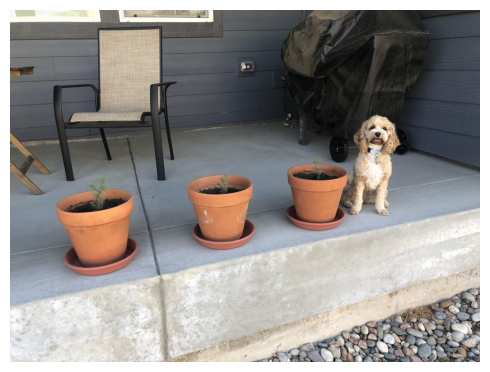

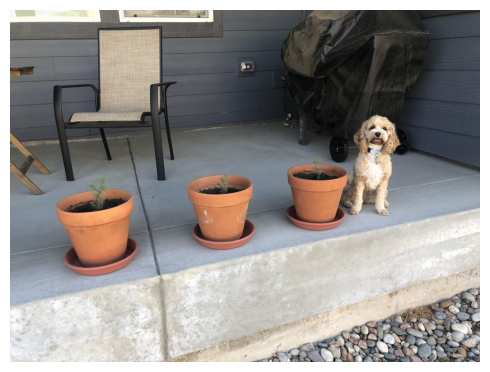

In [ ]:
#filepath = keras.utils.get_file(origin="https://imgur.com/gCNcJJI")
image = keras.utils.load_img("/content/gCNcJJI - Imgur.jpg")
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

In [ ]:
image.shape

(3024, 4032, 3)

Чтобы использовать `YOLOV8Detector` архитектуру с магистралью ResNet50, вам необходимо изменить размер изображения до размера, кратного 64. Это необходимо для обеспечения совместимости с количеством операций уменьшения масштаба, выполняемых слоями свертки в ResNet.

Если операция изменения размера искажает соотношение сторон входных данных, модель будет работать значительно хуже. Для предварительно обученной `"yolo_v8_m_pascalvoc"` предустановки, которую мы используем, финал `MeanAveragePrecision` в `pascalvoc/2012` оценочном наборе снижается до значения `0.15` from `0.38` при использовании простой операции изменения размера.

Кроме того, если вы обрезаете изображение, чтобы сохранить соотношение сторон, как при классификации, в вашей модели могут полностью пропасть некоторые ограничивающие рамки. Таким образом, при выполнении вывода по модели обнаружения объектов мы рекомендуем использовать отступы до желаемого размера, одновременно изменяя размер самого длинного размера, чтобы он соответствовал соотношению сторон.

KerasCV упрощает изменение размера; просто перейдите `pad_to_aspect_ratio=True` на `keras_cv.layers.Resizing` слой.

Это можно реализовать в одной строке кода:


In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

Это можно использовать в качестве конвейера предварительной обработки вывода:

In [ ]:
image_batch = inference_resizing([image])

`keras_cv.visualization.plot_bounding_box_gallery()`поддерживает `class_mapping` параметр, позволяющий указать, к какому классу было присвоено каждое поле. Давайте теперь соберем отображение классов.

In [ ]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

In [ ]:
class_mapping

{0: 'Aeroplane',
 1: 'Bicycle',
 2: 'Bird',
 3: 'Boat',
 4: 'Bottle',
 5: 'Bus',
 6: 'Car',
 7: 'Cat',
 8: 'Chair',
 9: 'Cow',
 10: 'Dining Table',
 11: 'Dog',
 12: 'Horse',
 13: 'Motorbike',
 14: 'Person',
 15: 'Potted Plant',
 16: 'Sheep',
 17: 'Sofa',
 18: 'Train',
 19: 'Tvmonitor',
 20: 'Total'}

Как и любой другой, `keras.Model` вы можете прогнозировать ограничивающие рамки с помощью `model.predict()` API.

In [ ]:
y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step


In [ ]:
y_pred.keys()
# boxes - рамки изображений
# classes - какие классы на изображении (100 штук)
# confidence - вероятность принадлежность к классу
# num_detection - кол-во найденных объектов

dict_keys(['boxes', 'classes', 'confidence', 'num_detections'])

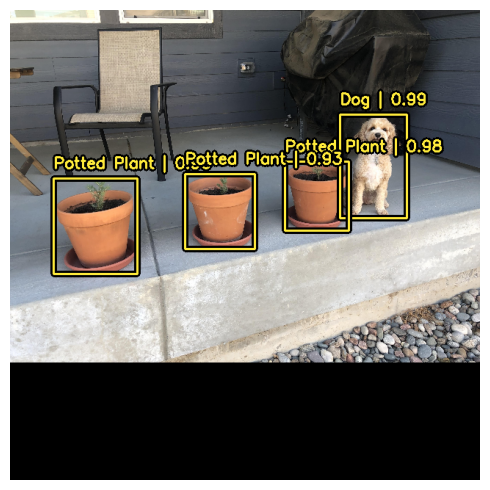

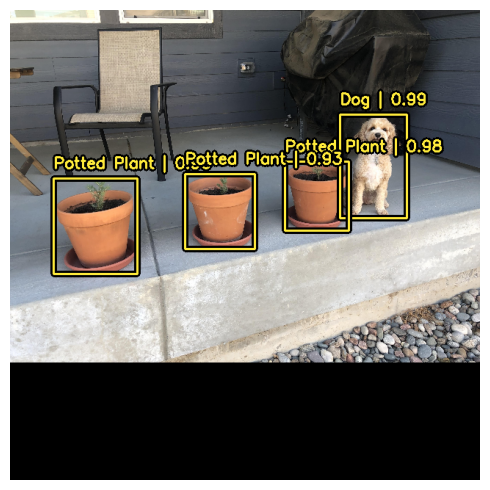

In [ ]:
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

Чтобы поддержать этот простой и интуитивно понятный рабочий процесс вывода, KerasCV выполняет немаксимальное подавление внутри `YOLOV8Detector` класса. Немаксимальное подавление — это традиционный вычислительный алгоритм, который решает проблему обнаружения моделью нескольких блоков для одного и того же объекта.

Немаксимальное подавление — это алгоритм с широкими возможностями настройки, и в большинстве случаев вам потребуется настроить параметры немаксимального подавления вашей модели. Это можно сделать, переопределив аргумент `prediction_decoder`.

Чтобы продемонстрировать эту концепцию, давайте временно отключим немаксимальное подавление на нашем YOLOV8Detector. Это можно сделать, записав в `prediction_decode` rатрибут.


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


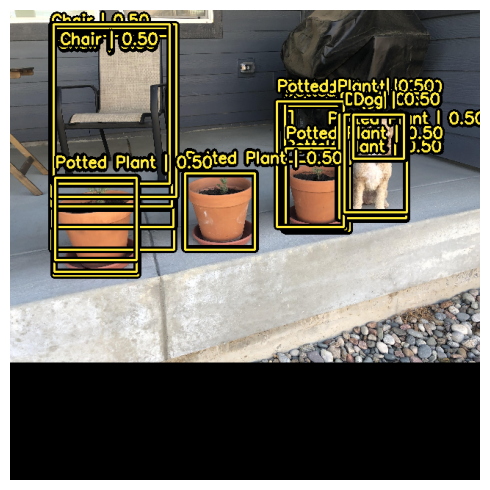

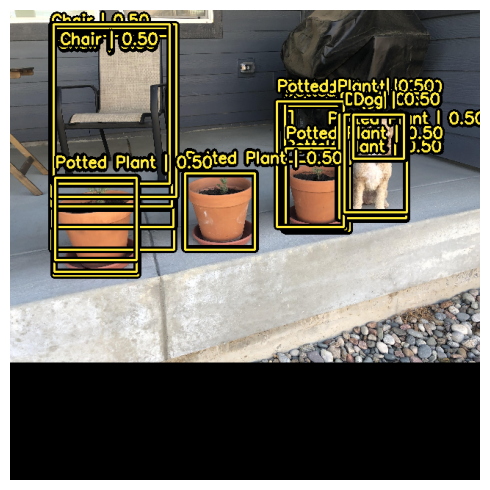

In [ ]:
# The following NonMaxSuppression layer is equivalent to disabling the operation
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=1.0,
    confidence_threshold=0.0,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)


Далее давайте переконфигурируем `keras_cv.layers`.`NonMaxSuppression` для нашего варианта использования! В этом случае мы настроим `iou_threshold` на `0.2` и `confidence_threshold` на `0.7`.

Увеличение `confidence_threshold` приведет к тому, что модель выведет только те поля, которые имеют более высокий показатель достоверности. iou_thresholdконтролирует порог пересечения по объединению (IoU), который должен иметь два поля, чтобы один был исключен. [Дополнительную информацию об этих параметрах можно найти в документации TensorFlow API](https://www.tensorflow.org/api_docs/python/tf/image/combined_non_max_suppression).


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


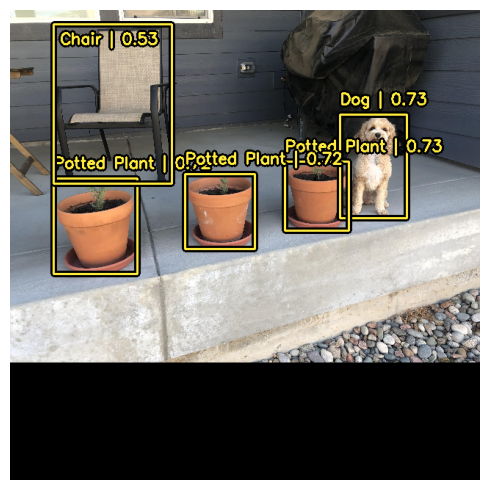

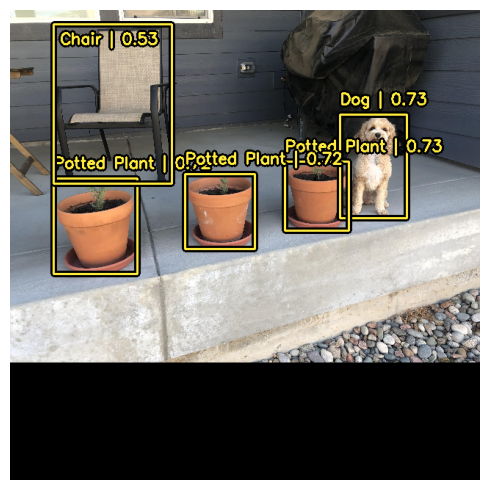

In [ ]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    # Decrease the required threshold to make predictions get pruned out
    iou_threshold=0.1,
    # Порог доверия
    confidence_threshold=0.51,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)



## Обучение пользовательской модели обнаружения объектов

![](https://storage.googleapis.com/keras-nlp/getting_started_guide/prof_keras_advanced.png)

Независимо от того, являетесь ли вы любителем обнаружения объектов или опытным ветераном, сборка конвейера обнаружения объектов с нуля — это масштабная задача. К счастью, все API обнаружения объектов KerasCV построены как модульные компоненты. Нужен ли вам полный конвейер, просто модель обнаружения объектов или даже просто утилита преобразования для преобразования ваших блоков из `xywh` формата в `xyxy`, KerasCV поможет вам.

В этом руководстве мы соберем полный конвейер обучения для модели обнаружения объектов KerasCV. Это включает в себя загрузку данных, увеличение, оценку показателей и логические выводы!

Для начала давайте разберемся со всем нашим импортом и определим глобальные параметры конфигурации.


In [ ]:
BATCH_SIZE = 4

## Загрузка данных

Для начала давайте обсудим загрузку данных и форматирование ограничивающей рамки. KerasCV имеет предопределенный формат ограничивающих рамок. Чтобы соответствовать этому, вам следует упаковать ограничивающие рамки в словарь, соответствующий приведенной ниже спецификации:

```
bounding_boxes = {
    # num_boxes may be a Ragged dimension
    'boxes': Tensor(shape=[batch, num_boxes, 4]),
    'classes': Tensor(shape=[batch, num_boxes])
}
```
`bounding_boxes['boxes']` содержит координаты вашей ограничивающей рамки в поддерживаемом KerasCV `bounding_box_format`. KerasCV требует `bounding_box_format` аргумента во всех компонентах, обрабатывающих ограничивающие рамки. Это сделано для того, чтобы максимизировать ваши возможности по подключению и использованию отдельных компонентов в их конвейерах обнаружения объектов, а также для обеспечения самодокументируемости кода во всех конвейерах обнаружения объектов.

Чтобы соответствовать стилю API KerasCV, при написании собственного загрузчика данных рекомендуется также поддерживать аргумент `bounding_box_format`. Это дает понять тем, кто вызывает ваш загрузчик данных, в каком формате находятся ограничивающие рамки. В этом примере мы форматируем наши рамки в соответствии с `xywh` форматом.

Например:

```python
train_ds, ds_info = your_data_loader.load(
    split='train', bounding_box_format='xywh', batch_size=8
)
```

Это явно приводит к появлению ограничивающих рамок в формате `xywh`. Подробнее о форматах ограничивающих рамок KerasCV можно прочитать [в документации API] (https://keras.io/api/keras_cv/bounding_box/formats/).

Наши данные загружаются в формат `{"images": images, "bounding_boxes": bounding_boxes}`. Этот формат поддерживается всеми компонентами предварительной обработки KerasCV.

Давайте загрузим некоторые данные и проверим, что они выглядят так, как мы ожидаем.


In [ ]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = keras_cv.bounding_box.convert_format(
        inputs["objects"]["bbox"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "classes": inputs["objects"]["label"],
        "boxes": boxes,
    }
    return {"images": image, "bounding_boxes": bounding_boxes}


def load_pascal_voc(split, dataset, bounding_box_format):
    ds = tfds.load(dataset, split=split, with_info=False, shuffle_files=True)
    ds = ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf_data.AUTOTUNE,
    )
    return ds


train_ds = load_pascal_voc(
    split="train", dataset="voc/2007", bounding_box_format="xywh"
)
eval_ds = load_pascal_voc(split="test", dataset="voc/2007", bounding_box_format="xywh")

train_ds = train_ds.shuffle(BATCH_SIZE * 4)

Далее давайте группируем наши данные.

В задачах обнаружения объектов KerasCV пользователям рекомендуется использовать неровные пакеты входных данных. Это связано с тем, что в PascalVOC изображения могут иметь разные размеры, а также с тем, что на одно изображение может приходиться разное количество ограничивающих рамок.

Чтобы создать неровный набор данных в `tf.data` конвейере, вы можете использовать этот `ragged_batch()`метод.


In [ ]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)

Давайте убедимся, что наш набор данных соответствует формату, который ожидает KerasCV. Используя эту `visualize_dataset()` функцию, вы можете визуально убедиться, что ваши данные находятся в том формате, который ожидает KerasCV. Если ограничивающие рамки не видны или видны не в тех местах, это признак того, что ваши данные неправильно отформатированы.

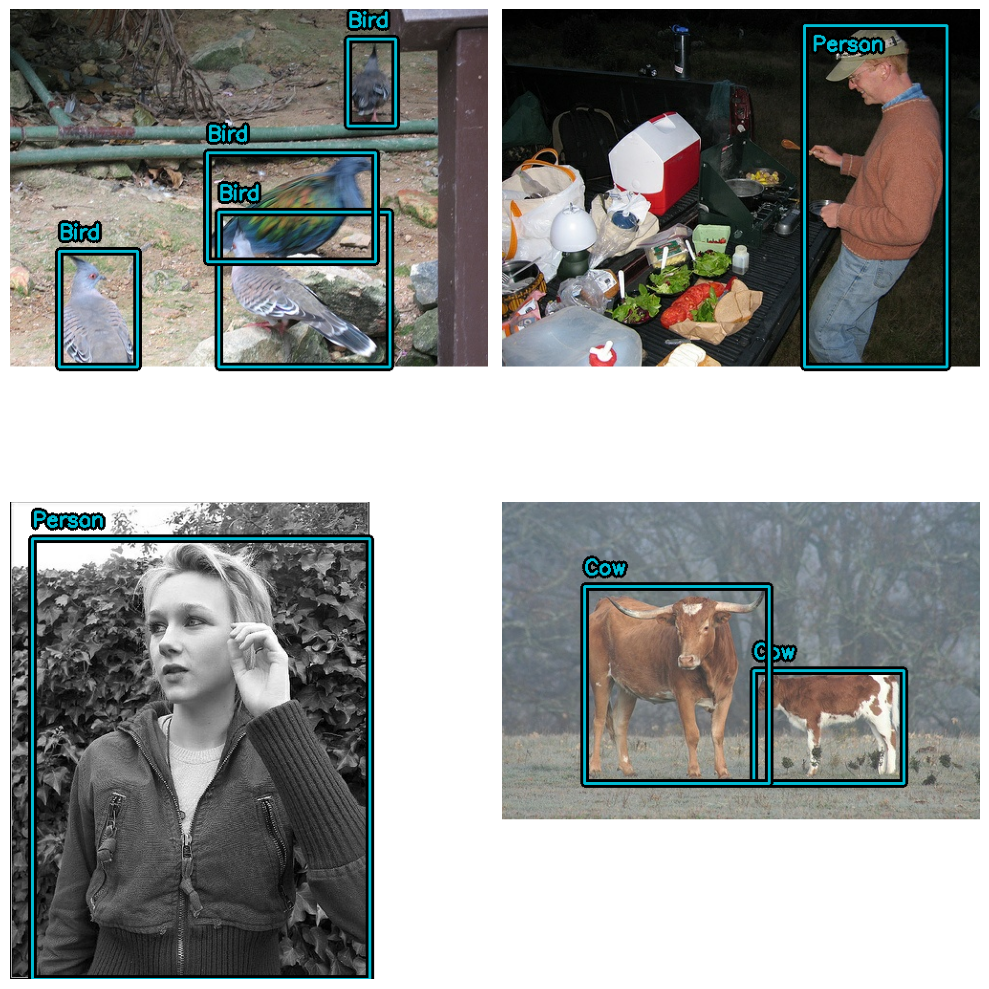

In [ ]:
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

И для оценочного набора:

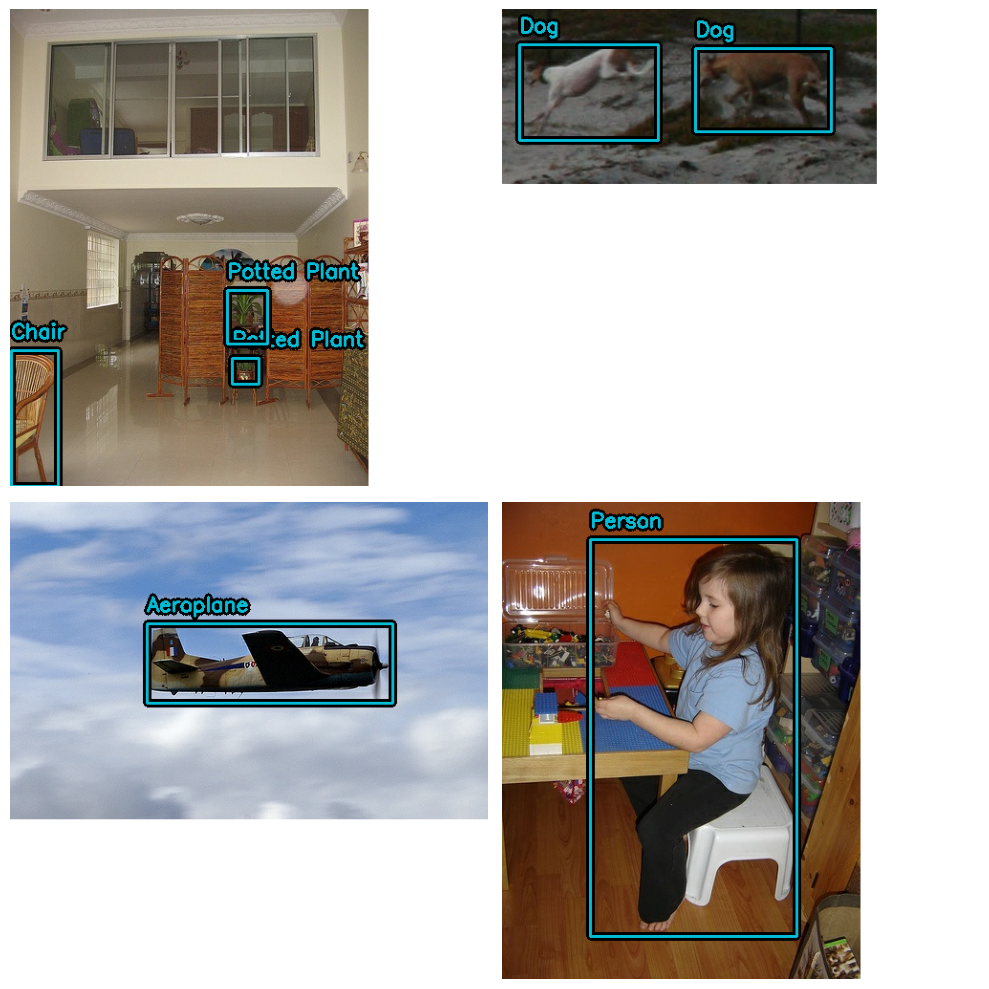

In [ ]:
visualize_dataset(
    eval_ds,
    bounding_box_format="xywh",
    value_range=(0, 255),
    rows=2,
    cols=2,
    # If you are not running your experiment on a local machine, you can also
    # make `visualize_dataset()` dump the plot to a file using `path`:
    # path="eval.png"
)

Похоже, все структурировано так, как и ожидалось. Теперь мы можем перейти к построению нашего конвейера увеличения данных.

## Увеличение данных

Одной из наиболее сложных задач при построении конвейеров обнаружения объектов является увеличение данных. Методы увеличения изображения должны учитывать основные ограничивающие рамки и соответствующим образом обновлять их.

К счастью, KerasCV изначально поддерживает расширение ограничивающей рамки с помощью своей обширной библиотеки [слоев расширения данных](https://keras.io/api/keras_cv/layers/preprocessing/). Код ниже загружает набор данных Pascal VOC и выполняет оперативное увеличение данных с использованием ограничительной рамки внутри конвейера `tf.data`.

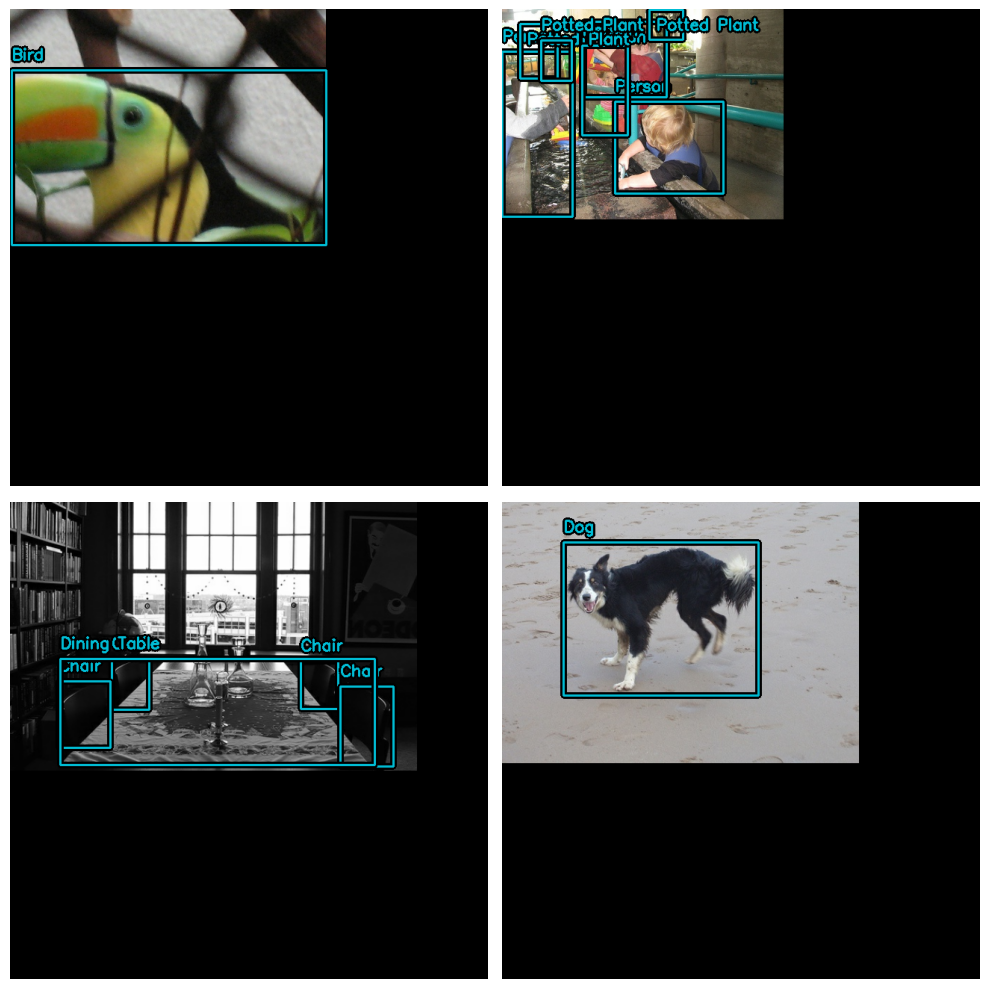

In [ ]:
augmenters = [
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
    keras_cv.layers.JitteredResize(
        target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"
    ),
]


def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)

train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf_data.AUTOTUNE)
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Отлично! Теперь у нас есть конвейер увеличения данных, удобный для использования ограничивающей рамки. Давайте отформатируем наш набор оценочных данных так, чтобы он соответствовал. Вместо использования `JitteredResize` давайте использовать детерминированный `keras_cv.layers.Resizing()` слой.


In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf_data.AUTOTUNE)

В связи с тем, что операция изменения размера различается для набора данных поезда, который используется `JitteredResize()` для изменения размера изображений, и набора данных вывода, который использует `layers.Resizing(pad_to_aspect_ratio=True)`, рекомендуется визуализировать оба набора данных:

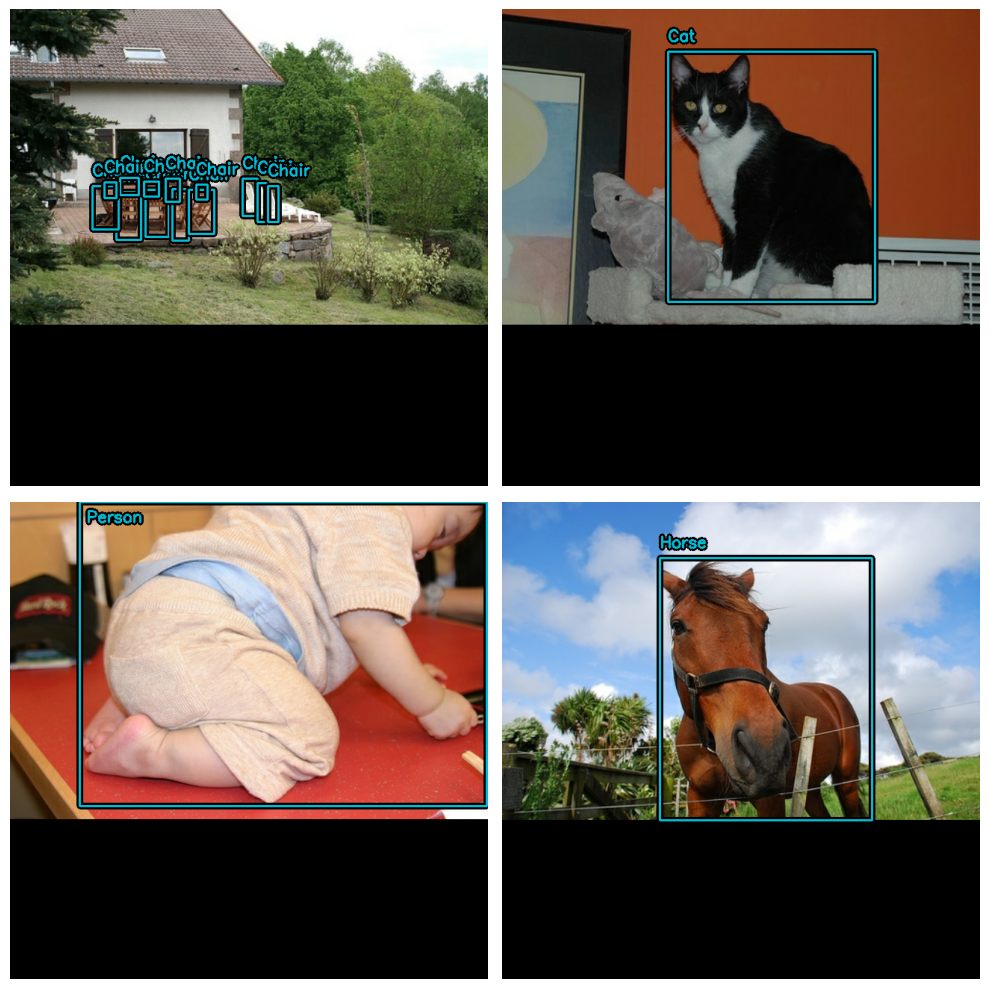

In [ ]:
visualize_dataset(
    eval_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

Наконец, давайте распакуем наши входные данные из словаря предварительной обработки и подготовимся передать их в нашу модель. Чтобы быть совместимым с TPU, тензоры ограничивающей рамки должны быть `Dense` вместо `Ragged`.

In [ ]:

def dict_to_tuple(inputs):
    return inputs["images"], bounding_box.to_dense(
        inputs["bounding_boxes"], max_boxes=32
    )


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)
eval_ds = eval_ds.map(dict_to_tuple, num_parallel_calls=tf_data.AUTOTUNE)

train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
eval_ds = eval_ds.prefetch(tf_data.AUTOTUNE)

## Оптимизатор
В этом руководстве мы используем стандартный оптимизатор SGD и полагаемся на обратный вызов [keras.callbacks.ReduceLROnPlateau](/api/callbacks/reduce_lr_on_plateau#reducelronplateau-class) для снижения скорости обучения.

Вы всегда захотите включить `global_clipnorm` при обучении моделей обнаружения объектов. Это сделано для устранения проблем с взрывным градиентом, которые часто возникают при обучении моделей обнаружения объектов.

In [ ]:
base_lr = 0.005
# including a global_clipnorm is extremely important in object detection tasks
optimizer = keras.optimizers.SGD(
    learning_rate=base_lr, momentum=0.9, global_clipnorm=10.0
)

Чтобы добиться наилучших результатов в вашем наборе данных, вам, вероятно, захочется вручную составить `PiecewiseConstantDecay` график скорости обучения. Хотя `PiecewiseConstantDecay` графики, как правило, работают лучше, они не переносят задачи.

## Функции потерь
Возможно, вы не знакомы с `"ciou"` потерей. Хотя эта потеря не характерна для других моделей, она иногда используется в мире обнаружения объектов.

Короче говоря, `«Полная IoU»` — это вариант пересечения с потерей объединения и используется из-за его свойств конвергенции.

В KerasCV вы можете использовать эту потерю, просто передав строку `"ciou"` в `compile()`. Мы также используем стандартную двоичную кроссэнтропийную потерю для главы класса.

In [ ]:
pretrained_model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
)

## Метрическая оценка
Наиболее популярными метриками обнаружения объектов являются метрики COCO, которые публикуются вместе с набором данных MSCOCO. KerasCV предоставляет простой в использовании набор метрик COCO под этим `keras_cv.callbacks.PyCOCOCallback` символом. Обратите внимание, что мы используем обратный вызов Keras вместо метрики Keras для вычисления метрик COCO. Это связано с тем, что вычисление метрик COCO требует одновременного хранения в памяти всех прогнозов модели для всего набора оценочных данных, что нецелесообразно делать во время обучения.

In [ ]:
coco_metrics_callback = keras_cv.callbacks.PyCOCOCallback(
    eval_ds.take(20), bounding_box_format="xywh"
)

Наш конвейер данных готов! Теперь мы можем перейти к созданию и обучению модели.

## Создание модели

Далее давайте воспользуемся API KerasCV для создания необученной модели YOLOV8Detector. В этом уроке мы используем предварительно обученную магистраль ResNet50 из набора данных imagenet.

KerasCV позволяет легко построить соединение `YOLOV8Detector` с любой из магистралей KerasCV. Просто используйте один из пресетов для желаемой архитектуры!

Например:


In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet",
    # For more info on supported bounding box formats, visit
    # https://keras.io/api/keras_cv/bounding_box/
    bounding_box_format="xywh",
    num_classes=20,
)

Это все, что нужно для создания KerasCV YOLOv8. YOLOv8 принимает кортежи плотных тензоров изображений и словари ограничительных рамок для `fit()` и `train_on_batch()`

Это соответствует тому, что мы построили в нашем входном конвейере выше.

## Обучение нашей модели

Осталось только обучить нашу модель. Модели обнаружения объектов KerasCV следуют стандартному рабочему процессу Keras, используя `compile()`и `fit()`.

Скомпилируем нашу модель:

In [ ]:
model.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer,
)

Если вы хотите полностью обучить модель, удалите `.take(20)` из всех ссылок на наборы данных (ниже и при инициализации обратного вызова метрик).

In [ ]:
%%time
model.fit(
    train_ds.take(20),
    # Run for 10-35~ epochs to achieve good scores.
    epochs=1,
    verbose=2,
    callbacks=[coco_metrics_callback],
)

20/20 ━━━━━━━━━━━━━━━━━━━━ 21s 748ms/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.29s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.018
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.018
 Average Recall     (AR) @[ IoU=0.50:0.95

## Выводы и графические результаты

KerasCV упрощает процесс обнаружения объектов. `model.predict(images)` возвращает тензор ограничивающих рамок. По умолчанию `YOLOV8Detector.predict()` выполнит для вас немаксимальную операцию подавления.

В этом разделе мы будем использовать `keras_cv` предоставленный пресет:

In [ ]:
model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

Далее для удобства строим набор данных с более крупными пакетами:

In [ ]:
visualization_ds = eval_ds.unbatch()
visualization_ds = visualization_ds.ragged_batch(16)
visualization_ds = visualization_ds.shuffle(8)

Давайте создадим простую функцию для построения наших выводов:

In [ ]:
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=2,
        cols=2,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )

Возможно, вам придется настроить операцию NonMaxSuppression для достижения визуально привлекательных результатов.

1/1 ━━━━━━━━━━━━━━━━━━━━ 27s 27s/step


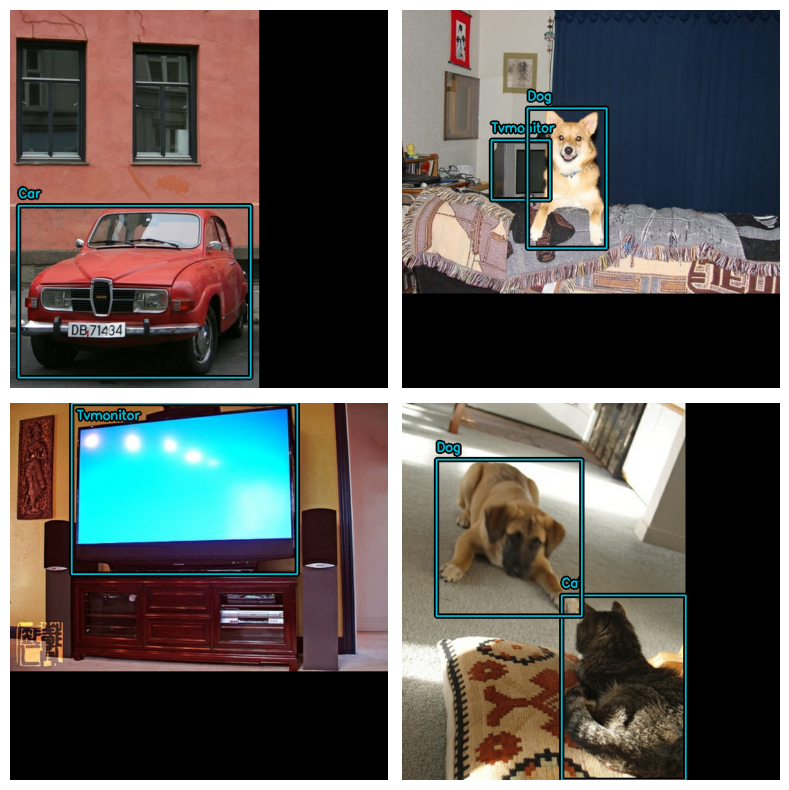

In [ ]:
model.prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.75,
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

Потрясающий! И последний полезный шаблон, о котором следует помнить, — это визуализация обнаружений в процессе keras.callbacks.Callbackмониторинга обучения:

In [ ]:
class VisualizeDetections(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        visualize_detections(
            self.model, bounding_box_format="xywh", dataset=visualization_ds
        )

## Выводы и следующие шаги
KerasCV позволяет легко создавать современные конвейеры обнаружения объектов. В этом руководстве мы начали с написания загрузчика данных, используя спецификацию ограничивающей рамки KerasCV. После этого мы собрали конвейер увеличения данных производственного уровня с использованием слоев предварительной обработки KerasCV в <50 строках кода.

Компоненты обнаружения объектов KerasCV могут использоваться независимо, но также имеют глубокую интеграцию друг с другом. KerasCV упрощает создание ограничивающих рамок производственного уровня, обучение моделей, визуализацию и оценку показателей.

Некоторые дополнительные упражнения для читателя:

* добавить дополнительные методы увеличения для улучшения производительности модели
* настроить гиперпараметры и увеличение данных, используемые для получения высококачественных результатов
* обучить модель обнаружения объектов на собственном наборе данных
Последний забавный фрагмент кода, демонстрирующий возможности API KerasCV!

In [ ]:
# stable_diffusion = keras_cv.models.StableDiffusionV2(512, 512)
# images = stable_diffusion.text_to_image(
#     prompt="A zoomed out photograph of a cool looking cat.  The cat stands in a beautiful forest",
#     negative_prompt="unrealistic, bad looking, malformed",
#     batch_size=4,
#     seed=1231,
# )
# encoded_predictions = model(images)
# y_pred = model.decode_predictions(encoded_predictions, images)
# visualization.plot_bounding_box_gallery(
#     images,
#     value_range=(0, 255),
#     y_pred=y_pred,
#     rows=2,
#     cols=2,
#     scale=5,
#     font_scale=0.7,
#     bounding_box_format="xywh",
#     class_mapping=class_mapping,
# )

# --------------------------------------------------------------------------------------------------------------------------

# ДОМАШНЕЕ ЗАДАНИЕ

Урок 7. Детектирование объектов
Либо 1 пункт либо пункт 2.

1. Сделайте краткий обзор любой научной работы, посвящённой алгоритму для object detection, не рассматривавшемуся на уроке. Проведите анализ: чем отличается выбранная вами архитектура нейронной сети от других? В чём плюсы и минусы данной архитектуры? Какие могут возникнуть трудности при применении этой архитектуры на практике?

2. Поиграться с кодом урока в разделе Advanced, поменять код и написать свои выводы.

загрузим картинку и визуализируем ее

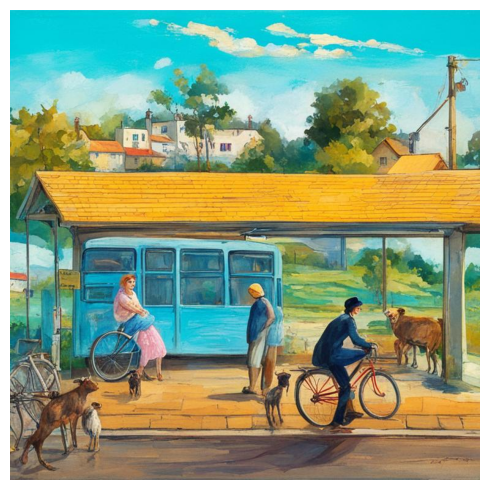

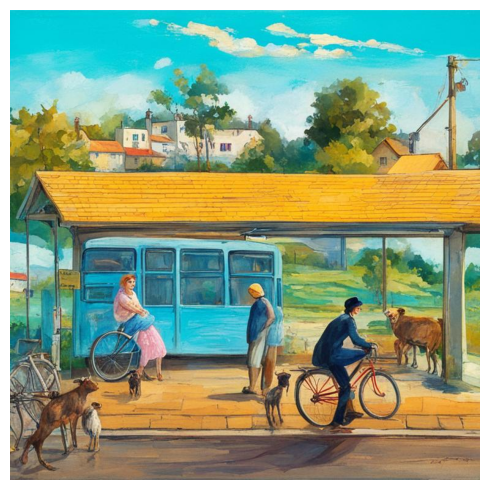

In [53]:
#filepath = keras.utils.get_file(origin="https://imgur.com/gCNcJJI")
image_2 = keras.utils.load_img("/content/photo_2024-04-16_13-04-01.jpg")
image_2 = np.array(image_2)

visualization.plot_image_gallery(
    np.array([image_2]),
    value_range=(0, 255),
    rows=1,
    cols=1,
    scale=5,
)

In [54]:
# Изменим размер на 640х640
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)
image_batch = inference_resizing([image_2])

Делаем детектирование объектов с помощью предварительной нейросети

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


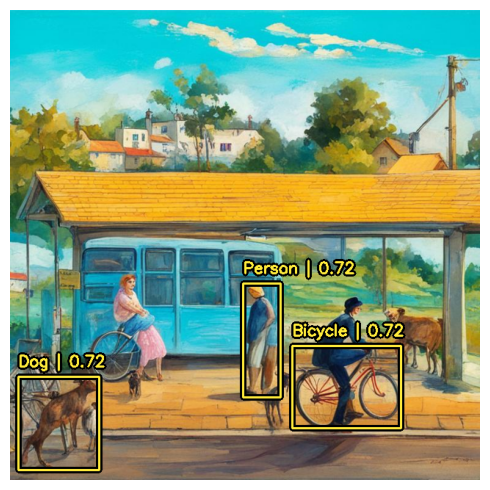

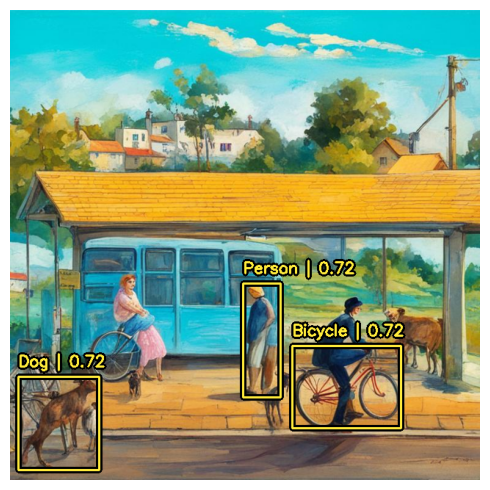

In [55]:
prediction_decoder = keras_cv.layers.NonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.2,
    confidence_threshold=0.7,
)
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
    prediction_decoder=prediction_decoder,
)

y_pred = pretrained_model.predict(image_batch)
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=5,
    font_scale=0.7,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
)

Повторно обучим нашу модель, только уже на 10 эпохах и проверим результат

In [ ]:
model_1 = keras_cv.models.YOLOV8Detector.from_preset(
    "resnet50_imagenet",
    bounding_box_format="xywh",
    num_classes=20,
)
model_1.compile(
    classification_loss="binary_crossentropy",
    box_loss="ciou",
    optimizer=optimizer,
)

In [ ]:
%%time
model_1.fit(
    train_ds.take(20),
    epochs=10,
    callbacks=[coco_metrics_callback],
)

Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 361ms/step
creating index...
index created!
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.34s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 Average Recall     (AR) @[ Io

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


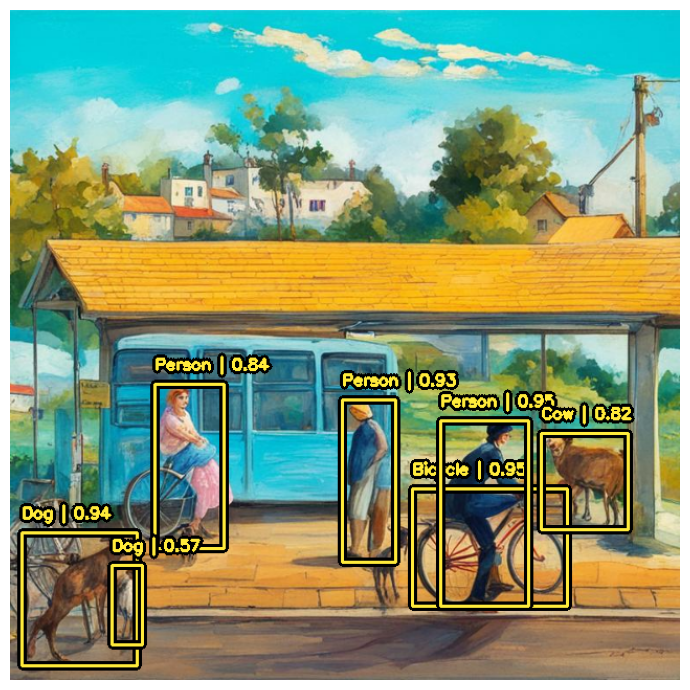

In [56]:
model_1 = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc",
    bounding_box_format="xywh",
)

# Делаем predict
y_pred_2 = model_1.predict(image_batch)

# Отрисовываем картинку с детектированием объектов
visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 255),
    bounding_box_format="xywh",
    y_pred=y_pred_2,
    scale=7,
    rows=1,
    cols=1,
    show=True,
    font_scale=0.5,
    class_mapping=class_mapping,
)

**Вывод:** Обе модели (и предварительная, и обучаемая) хорошо справились с детектированием объектов на изображении. 
Предварительная модель нашла на картинке 1 человека, собаку и велосипед. А вот обученная модель показала лучшие результаты и нашла: 3 человека, велосипед, 2 собаки и корову. Причем сделал это с большей вероятностью принадлежности к классу.